# Install MMDetection

In [1]:
!pwd

/aiffel/aiffel/aimmo


In [2]:
# Check nvcc version
!nvcc -V
# Check GCC version
!gcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2021 NVIDIA Corporation
Built on Wed_Jun__2_19:15:15_PDT_2021
Cuda compilation tools, release 11.4, V11.4.48
Build cuda_11.4.r11.4/compiler.30033411_0
gcc (Ubuntu 9.3.0-17ubuntu1~20.04) 9.3.0
Copyright (C) 2019 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



In [3]:
%cd mmdetection
!pip install -v -e .

/aiffel/aiffel/aimmo/mmdetection
Using pip 21.3.1 from /opt/conda/lib/python3.9/site-packages/pip (python 3.9)
Obtaining file:///aiffel/aiffel/aimmo/mmdetection
  Running command python setup.py egg_info
  running egg_info
  creating /tmp/pip-pip-egg-info-qrce9yiy/mmdet.egg-info
  writing /tmp/pip-pip-egg-info-qrce9yiy/mmdet.egg-info/PKG-INFO
  writing dependency_links to /tmp/pip-pip-egg-info-qrce9yiy/mmdet.egg-info/dependency_links.txt
  writing requirements to /tmp/pip-pip-egg-info-qrce9yiy/mmdet.egg-info/requires.txt
  writing top-level names to /tmp/pip-pip-egg-info-qrce9yiy/mmdet.egg-info/top_level.txt
  writing manifest file '/tmp/pip-pip-egg-info-qrce9yiy/mmdet.egg-info/SOURCES.txt'
  reading manifest file '/tmp/pip-pip-egg-info-qrce9yiy/mmdet.egg-info/SOURCES.txt'
  reading manifest template 'MANIFEST.in'
  adding license file 'LICENSE'
  writing manifest file '/tmp/pip-pip-egg-info-qrce9yiy/mmdet.egg-info/SOURCES.txt'
  Preparing metadata (setup.py) ... done
  Running command

In [4]:
# Install MMCV
!pip install mmcv-full -f https://download.openmmlab.com/mmcv/dist/cu111/torch1.9.0/index.html

Looking in links: https://download.openmmlab.com/mmcv/dist/cu111/torch1.9.0/index.html
     |████████████████████████████████| 49.7 MB 4.1 MB/s             
     |████████████████████████████████| 190 kB 5.6 MB/s            


In [5]:
# Check Pytorch installation
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())

# Check MMDetection installation
import mmdet
print(mmdet.__version__)

# Check mmcv installation
from mmcv.ops import get_compiling_cuda_version, get_compiler_version
print(get_compiling_cuda_version())
print(get_compiler_version())

1.9.1+cu111 True
2.25.3
11.1
GCC 7.3


/opt/conda/lib/python3.9/site-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(


# Perform Inference with An MMDet detector

In [6]:
# %cd mmdetection
# !mkdir checkpoints
#!wget -c https://download.openmmlab.com/mmdetection/v2.0/yolo/yolov3_d53_mstrain-608_273e_coco/yolov3_d53_mstrain-608_273e_coco_20210518_115020-a2c3acb8.pth \
#      -O checkpoints/yolov3_d53_mstrain-608_273e_coco_20210518_115020-a2c3acb8.pth

In [7]:
import mmcv
from mmcv.runner import load_checkpoint

from mmdet.apis import inference_detector, show_result_pyplot
from mmdet.models import build_detector

# # Choose to use a config and initialize the detector
# config = 'configs/yolo/yolov3_d53_mstrain-608_273e_coco.py'
# # Setup a checkpoint file to load
# checkpoint = 'checkpoints/yolov3_d53_mstrain-608_273e_coco_20210518_115020-a2c3acb8.pth'

# # Set the device to be used for evaluation
device='cuda:0'

# # Load the config
# config = mmcv.Config.fromfile(config)
# # Set pretrained to be None since we do not need pretrained model here
# config.model.pretrained = None

# # Initialize the detector
# model = build_detector(config.model)

# # Load checkpoint
# checkpoint = load_checkpoint(model, checkpoint, map_location=device)

# # Set the classes of models for inference
# model.CLASSES = checkpoint['meta']['CLASSES']

# # We need to set the model's cfg for inference
# model.cfg = config

# # Convert the model to GPU
# model.to(device)
# # Convert the model into evaluation mode
# model.eval()

In [8]:
# # Use the detector to do inference
# img = 'data/val_image/1654752735656_FR-View-CMR-Wide.png'
# result = inference_detector(model, img)

In [9]:
# # Let's plot the result
# show_result_pyplot(model, img, result, score_thr=0.3)

# Train A Detector on A Customized Dataset

In [10]:
from mmdet.datasets.builder import DATASETS
from mmdet.datasets.coco import CocoDataset  

@DATASETS.register_module(force=True)
class Aimmo(CocoDataset):
    CLASSES = ('car', 'bus', 'truck', 'pedestrian')

In [11]:
# import torch.nn as nn

# from mmdet.datasets.builder import LOSSES
# from .utils import weighted_loss

# @LOSSES.register_module()
# class FocalLoss(nn.Module):

#     def __init__(self,
#                  use_sigmoid=True,
#                  gamma=2.0,
#                  alpha=0.25,
#                  reduction='mean',
#                  loss_weight=1.0):
#         pass

# Modify the config

In [12]:
from mmcv import Config
cfg = Config.fromfile('./configs/yolo/yolov3_d53_mstrain-608_273e_coco.py')

In [13]:
from mmdet.apis import init_detector
from mmdet.datasets import build_dataset
from mmdet.models import build_detector
from mmdet.apis import train_detector
import os.path as osp

from mmdet.apis import set_random_seed
cfg.dataset_type = 'Aimmo'
cfg.data_root = 'data/'


cfg.data.train.type = 'Aimmo'
cfg.data.train.data_root = 'data/'
cfg.data.train.ann_file = 'COCO_format_train_no_other.json'
cfg.data.train.img_prefix = 'train_image'

cfg.data.val.type = 'Aimmo'
cfg.data.val.data_root = 'data/'
cfg.data.val.ann_file = 'COCO_format_val_no_other.json'
cfg.data.val.img_prefix = 'val_image'

cfg.data.test.type = 'Aimmo'
cfg.data.test.data_root = 'data/'
cfg.data.test.ann_file = 'COCO_format_val_no_other.json'
cfg.data.test.img_prefix = 'val_image'


# modify num classes of the model in box head
cfg.model.bbox_head.num_classes = 4
# If we need to finetune a model based on a pre-trained detector, we need to
# use load_from to set the path of checkpoints.
# cfg.load_from = 'checkpoints/yolov3_d53_mstrain-608_273e_coco_20210518_115020-a2c3acb8.pth'
cfg.resume_from = 'tutorial_exps_anchor_generator/epoch_14.pth'
# Set up working dir to save files and logs.
cfg.work_dir = './tutorial_exps_anchor_generator'

# The original learning rate (LR) is set for 8-GPU training.
# We divide it by 8 since we only use one GPU.
#cfg.optimizer.lr = 0.00125
#cfg.lr_config.warmup = None
cfg.log_config.interval = 10

# Change the evaluation metric since we use customized dataset.
cfg.evaluation.metric = 'bbox'
# We can set the evaluation interval to reduce the evaluation times
cfg.evaluation.interval = 1
# We can set the checkpoint saving interval to reduce the storage cost
cfg.checkpoint_config.interval = 1

#image resize
cfg.train_pipeline[4]['img_scale']=(960, 960)
cfg.test_pipeline[1]['img_scale']=(960, 960)
cfg.data.train.pipeline[4]['img_scale']=(960, 960)
cfg.data.val.pipeline[1]['img_scale']=(960, 960)
cfg.data.test.pipeline[1]['img_scale']=(960,960)

cfg.model.bbox_head.anchor_generator['base_sizes']=[[(116, 90), (110, 180), (330, 248)],
  [(30, 61), (70, 30), (59, 119)],
  [(7, 10), (11, 25), (28, 15)]]


# cfg.model.bbox_head.loss_cls = dict(type='FocalLoss', use_sigmoid=True, gamma=2.0, alpha=0.25, reduction='mean',loss_weight=1.0,
#                  activated=False)

# Set seed thus the results are more reproducible
cfg.seed = 0
set_random_seed(0, deterministic=False)
cfg.gpu_ids = range(1)

# # We can also use tensorboard to log the training process
cfg.log_config.hooks = [
    dict(type='TextLoggerHook'),
    dict(type='TensorboardLoggerHook')]

cfg.data.samples_per_gpu = 6
cfg.data.workers_per_gpu = 0
cfg['device'] = 'cuda'

cfg.runner['max_epochs'] = 15


# We can initialize the logger for training and have a look
# at the final config used for training
print(f'Config:\n{cfg.pretty_text}')

Config:
checkpoint_config = dict(interval=1)
log_config = dict(
    interval=10,
    hooks=[dict(type='TextLoggerHook'),
           dict(type='TensorboardLoggerHook')])
custom_hooks = [dict(type='NumClassCheckHook')]
dist_params = dict(backend='nccl')
log_level = 'INFO'
load_from = None
resume_from = 'tutorial_exps_anchor_generator/epoch_14.pth'
workflow = [('train', 1)]
opencv_num_threads = 0
mp_start_method = 'fork'
auto_scale_lr = dict(enable=False, base_batch_size=64)
model = dict(
    type='YOLOV3',
    backbone=dict(
        type='Darknet',
        depth=53,
        out_indices=(3, 4, 5),
        init_cfg=dict(type='Pretrained', checkpoint='open-mmlab://darknet53')),
    neck=dict(
        type='YOLOV3Neck',
        num_scales=3,
        in_channels=[1024, 512, 256],
        out_channels=[512, 256, 128]),
    bbox_head=dict(
        type='YOLOV3Head',
        num_classes=4,
        in_channels=[512, 256, 128],
        out_channels=[1024, 512, 256],
        anchor_generator=dict(


In [14]:
# cfg.model.bbox_head.anchor_generator['base_sizes']=[[(116, 90), (156, 198), (200, 300), (373, 326)],
#   [(30, 61), (62, 45), (59, 119)],
#   [(5,3), (10, 13), (16, 30), (33, 23)]]
# cfg.model.bbox_head.anchor_generator['base_sizes']

In [15]:
# cfg.model.bbox_head.anchor_generator['strides']=[32, 16, 8, 4]

# Train a new detector


In [16]:
from mmdet.datasets import build_dataset
from mmdet.models import build_detector
from mmdet.apis import train_detector


# Build dataset
datasets = [build_dataset(cfg.data.train)]

# Build the detector
model = build_detector(cfg.model)
# Add an attribute for visualization convenience
model.CLASSES = datasets[0].CLASSES

# Create work_dir
mmcv.mkdir_or_exist(osp.abspath(cfg.work_dir))
train_detector(model, datasets, cfg, distributed=False, validate=True)

loading annotations into memory...
Done (t=1.18s)
creating index...
index created!


2022-12-08 10:41:50,103 - mmdet - INFO - Automatic scaling of learning rate (LR) has been disabled.


loading annotations into memory...


2022-12-08 10:41:50,528 - mmdet - INFO - load checkpoint from local path: tutorial_exps_anchor_generator/epoch_14.pth


Done (t=0.40s)
creating index...
index created!


2022-12-08 10:41:55,433 - mmdet - INFO - resumed epoch 14, iter 48762
2022-12-08 10:41:55,435 - mmdet - INFO - Start running, host: root@wjdsy9npqc9umyjmno3xcxntp-57858f7b55-x5tsl, work_dir: /aiffel/aiffel/aimmo/mmdetection/tutorial_exps_anchor_generator
2022-12-08 10:41:55,436 - mmdet - INFO - Hooks will be executed in the following order:
before_run:
(VERY_HIGH   ) StepLrUpdaterHook                  
(NORMAL      ) CheckpointHook                     
(LOW         ) EvalHook                           
(VERY_LOW    ) TextLoggerHook                     
(VERY_LOW    ) TensorboardLoggerHook              
 -------------------- 
before_train_epoch:
(VERY_HIGH   ) StepLrUpdaterHook                  
(NORMAL      ) NumClassCheckHook                  
(LOW         ) IterTimerHook                      
(LOW         ) EvalHook                           
(VERY_LOW    ) TextLoggerHook                     
(VERY_LOW    ) TensorboardLoggerHook              
 -------------------- 
before_train_iter:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2334/2334, 5.8 task/s, elapsed: 405s, ETA:     0s

2022-12-08 13:25:28,139 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.37s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=7.94s).
Accumulating evaluation results...


2022-12-08 13:25:38,032 - mmdet - INFO - 
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.508
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.845
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.550
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.279
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.469
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.611
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.591
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.591
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.591
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.453
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.559
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000

DONE (t=1.43s).


# Test the Trained Detector

/aiffel/aiffel/aimmo/mmdetection/mmdet/datasets/utils.py:66: UserWarning: "ImageToTensor" pipeline is replaced by "DefaultFormatBundle" for batch inference. It is recommended to manually replace it in the test data pipeline in your config file.
  warnings.warn(


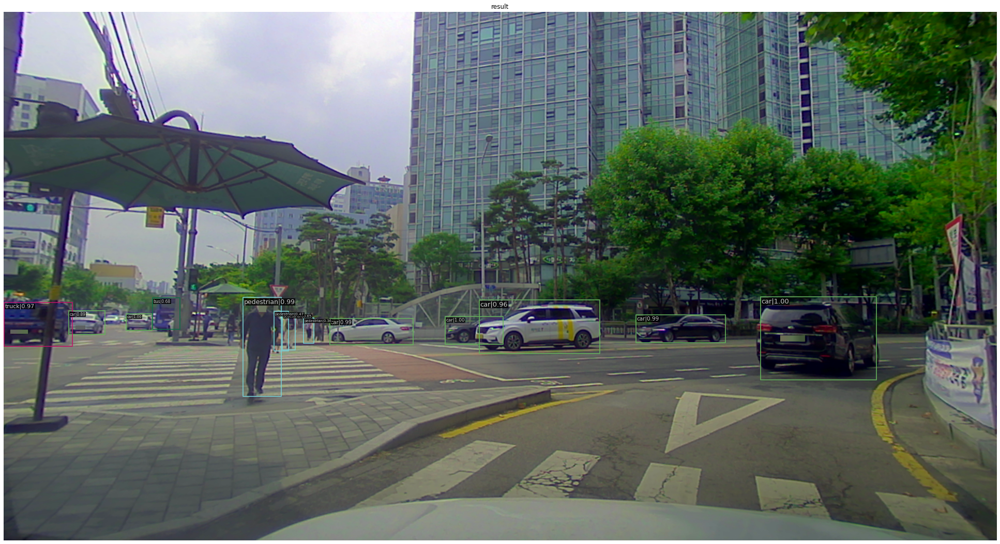

In [17]:
img = mmcv.imread('/aiffel/aiffel/aimmo/mmdetection/data/train_image/1654752844879_FR-View-CMR-Wide.png')

model.cfg = cfg
result = inference_detector(model, img)
show_result_pyplot(model, img, result)

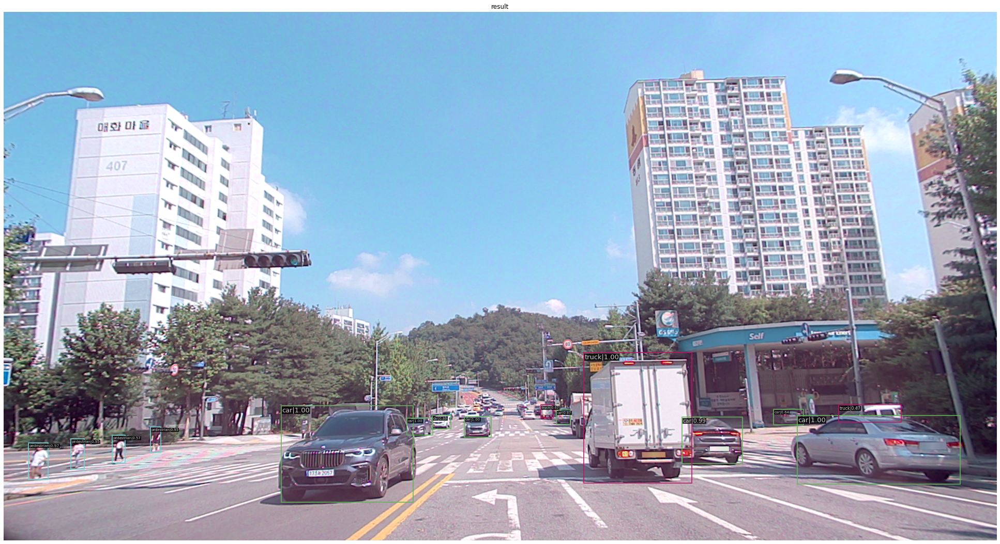

In [18]:
img = mmcv.imread('/aiffel/aiffel/aimmo/mmdetection/data/train_image/1660268108830_FR-View-CMR-Wide.png')

model.cfg = cfg
result = inference_detector(model, img)
show_result_pyplot(model, img, result)

# 인퍼런스 이미지(3장)

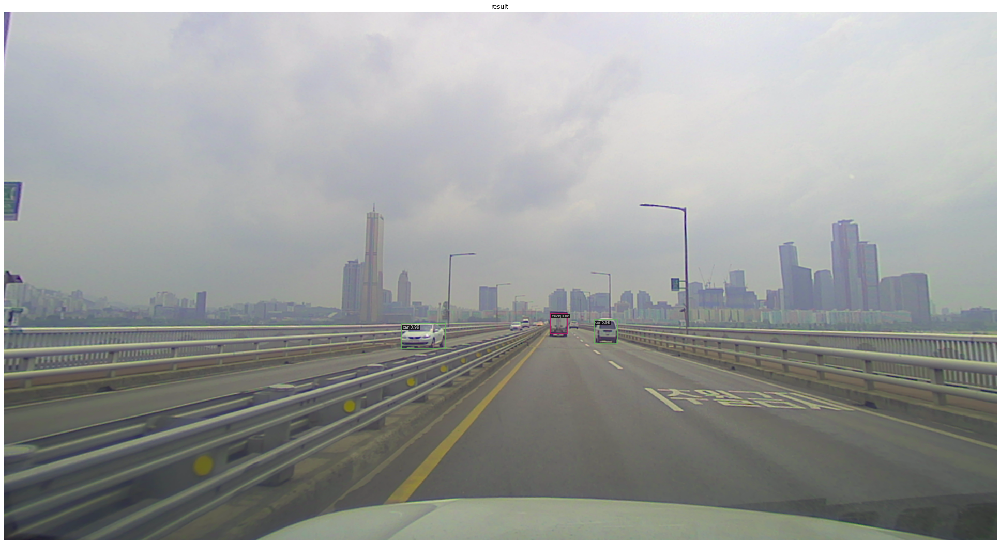

In [23]:
img = mmcv.imread('/aiffel/aiffel/aimmo/mmdetection/data/sample/image/1654752556636_FR-View-CMR-Wide.png')

model.cfg = cfg
result = inference_detector(model, img)
show_result_pyplot(model, img, result)

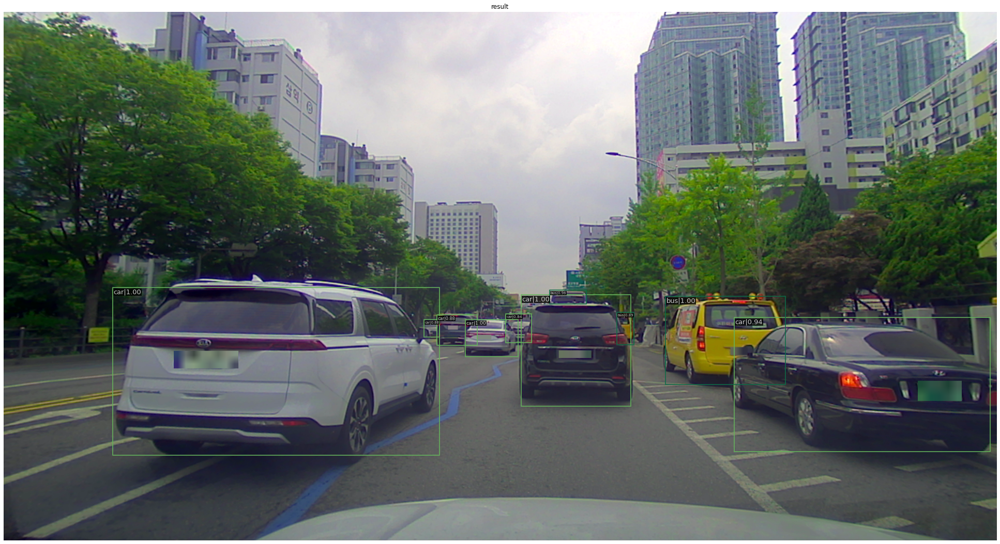

In [24]:
img = mmcv.imread('/aiffel/aiffel/aimmo/mmdetection/data/sample/image/1654752723481_FR-View-CMR-Wide.png')

model.cfg = cfg
result = inference_detector(model, img)
show_result_pyplot(model, img, result)

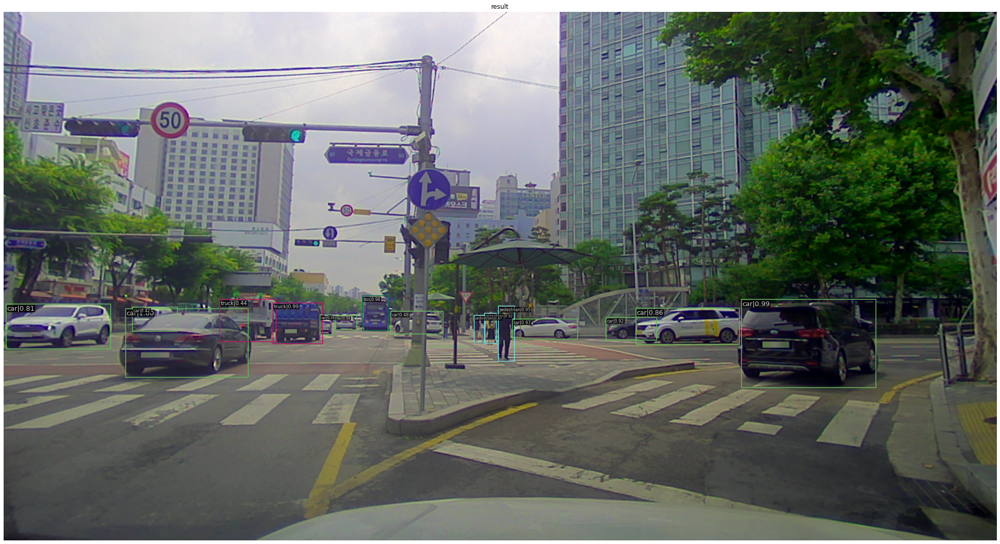

In [25]:
img = mmcv.imread('/aiffel/aiffel/aimmo/mmdetection/data/sample/image/1654752843690_FR-View-CMR-Wide.png')

model.cfg = cfg
result = inference_detector(model, img)
show_result_pyplot(model, img, result)